## Author: Xiang (Albert) Li
## USC ID: 1892796881
## Github Userid: XiangLi1209
## Created Time: Mar 21st, 2023

## Q1. Decision Trees as Interpretable Models

### (a) Download the Accute In amations data from https://archive.ics.uci.edu/ml/datasets/Acute+Inflammations.

In [3]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier, plot_tree
import matplotlib.pyplot as plt
import codecs

# Load the dataset that I have manually changed into a .csv file, and changed all , into .

with codecs.open('../data/diagnosis_data.csv', 'r', encoding='utf-16') as f:
    # process the file
    data_temp=f.read()
rows = data_temp.strip().split('\r\n')
cols = [row.split('\t') for row in rows]
data = pd.DataFrame(cols, columns=['Temp','Nausea','LumbarPain','UrinePushing',
                                   'MicturitionPains','Burning','Inflammation','Nephritis'])
data = data.astype({'Temp': float,'Nausea':'category','LumbarPain':'category',
                    'UrinePushing':'category','MicturitionPains':'category', 
                    'Burning':'category','Inflammation':'category','Nephritis': 'category'})
data

,Temp,Nausea,LumbarPain,UrinePushing,MicturitionPains,Burning,Inflammation,Nephritis
0,35.5,no,yes,no,no,no,no,no
1,35.9,no,no,yes,yes,yes,yes,no
2,35.9,no,yes,no,no,no,no,no
3,36.0,no,no,yes,yes,yes,yes,no
4,36.0,no,yes,no,no,no,no,no
...,...,...,...,...,...,...,...,...
115,41.4,no,yes,yes,no,yes,no,yes
116,41.5,no,no,no,no,no,no,no
117,41.5,yes,yes,no,yes,no,no,yes
118,41.5,no,yes,yes,no,yes,no,yes


### (b) Build a decision tree on the whole data set and plot it [<sup>1</sup>](#fn1).

In [4]:
# Split the dataset into features and target
data1 = data.replace({'yes': 1, 'no': 0})
data1 = data1.astype({'Temp': float, 'Nausea': 'category', 'LumbarPain': 'category', 
                      'UrinePushing': 'category','MicturitionPains': 'category', 
                      'Burning': 'category', 'Inflammation': 'category', 
                      'Nephritis': 'category'})
display(data1)
# Split the data into X and Y vectors
X = data1.iloc[:, :-2]
Y = data1.iloc[:, -2:]

# Get an overview of the data we are working on
print(data1.describe(include='all'))


,Temp,Nausea,LumbarPain,UrinePushing,MicturitionPains,Burning,Inflammation,Nephritis
0,35.5,0,1,0,0,0,0,0
1,35.9,0,0,1,1,1,1,0
2,35.9,0,1,0,0,0,0,0
3,36.0,0,0,1,1,1,1,0
4,36.0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...
115,41.4,0,1,1,0,1,0,1
116,41.5,0,0,0,0,0,0,0
117,41.5,1,1,0,1,0,0,1
118,41.5,0,1,1,0,1,0,1


              Temp  Nausea  LumbarPain  UrinePushing  MicturitionPains  \
count   120.000000   120.0       120.0         120.0             120.0   
unique         NaN     2.0         2.0           2.0               2.0   
top            NaN     0.0         1.0           1.0               0.0   
freq           NaN    91.0        70.0          80.0              61.0   
mean     38.724167     NaN         NaN           NaN               NaN   
std       1.819132     NaN         NaN           NaN               NaN   
min      35.500000     NaN         NaN           NaN               NaN   
25%      37.100000     NaN         NaN           NaN               NaN   
50%      37.950000     NaN         NaN           NaN               NaN   
75%      40.600000     NaN         NaN           NaN               NaN   
max      41.500000     NaN         NaN           NaN               NaN   

        Burning  Inflammation  Nephritis  
count     120.0         120.0      120.0  
unique      2.0          

In [5]:
Y = data.iloc[:, -2:]

Y = pd.get_dummies(Y, columns=Y.columns[0:])
Y

,Inflammation_no,Inflammation_yes,Nephritis_no,Nephritis_yes
0,1,0,1,0
1,0,1,1,0
2,1,0,1,0
3,0,1,1,0
4,1,0,1,0
...,...,...,...,...
115,1,0,0,1
116,1,0,1,0
117,1,0,0,1
118,1,0,0,1


In [6]:
Y = data.iloc[:, -2:]

Y = pd.get_dummies(Y, columns=Y.columns[0:])
Y1 = Y.iloc[:,0]

Y2 = Y.iloc[:,3]
Y3 = pd.DataFrame({'Inflammation_no':Y1,'Nephritis_no':Y2})
Y3

,Inflammation_no,Nephritis_no
0,1,0
1,0,0
2,1,0
3,0,0
4,1,0
...,...,...
115,1,1
116,1,0
117,1,1
118,1,1


[Text(0.4, 0.9, 'Temp <= 37.95\ngini = 0.493\nsamples = 120\nvalue = [[59, 61]\n[70, 50]]'),
 Text(0.2, 0.7, 'UrinePushing <= 0.5\ngini = 0.222\nsamples = 60\nvalue = [[40, 20]\n[60, 0]]'),
 Text(0.1, 0.5, 'gini = 0.0\nsamples = 20\nvalue = [[0, 20]\n[20, 0]]'),
 Text(0.3, 0.5, 'gini = 0.0\nsamples = 40\nvalue = [[40, 0]\n[40, 0]]'),
 Text(0.6, 0.7, 'LumbarPain <= 0.5\ngini = 0.355\nsamples = 60\nvalue = [[19, 41]\n[10, 50]]'),
 Text(0.5, 0.5, 'gini = 0.0\nsamples = 10\nvalue = [[0, 10]\n[10, 0]]'),
 Text(0.7, 0.5, 'MicturitionPains <= 0.5\ngini = 0.236\nsamples = 50\nvalue = [[19, 31]\n[0, 50]]'),
 Text(0.6, 0.3, 'gini = 0.0\nsamples = 21\nvalue = [[0, 21]\n[0, 21]]'),
 Text(0.8, 0.3, 'UrinePushing <= 0.5\ngini = 0.226\nsamples = 29\nvalue = [[19, 10]\n[0, 29]]'),
 Text(0.7, 0.1, 'gini = 0.0\nsamples = 10\nvalue = [[0, 10]\n[0, 10]]'),
 Text(0.9, 0.1, 'gini = 0.0\nsamples = 19\nvalue = [[19, 0]\n[0, 19]]')]

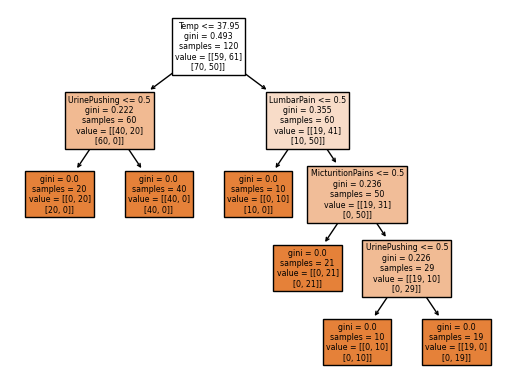

In [7]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier, export_graphviz
import graphviz
from sklearn import tree


X = data.iloc[:, :-2]
X = X.replace({'no':0,'yes':1})


Y = data.iloc[:, -2:]
Y = pd.get_dummies(Y, columns=Y.columns[0:])


# Build a decision tree on the whole dataset
dc = DecisionTreeClassifier(random_state=0)
dc.fit(X,Y3)

# create graph visualization

tree.plot_tree(dc,feature_names=list(X.columns),class_names=list(Y.columns),filled=True)


### (c) Convert the decision rules into a set of IF-THEN rules  [<sup>2</sup>](#fn2).

In [8]:
def diagnose_inflammation(temp, lumbar_pain, urine_pushing, micturition_pains):    
    if Temp <= 37.95:
        if UrinePushing <= 0.5:
            if gini == 0.0:
                return [[0, 20], [20, 0]]
            else:
                return [[40, 0], [40, 0]]
        else:
            if LumbarPain <= 0.5:
                return [[0, 10], [10, 0]]
            else:
                if MicturitionPains <= 0.5:
                    return [[0, 21], [0, 21]]
                else:
                    return [[19, 0], [0, 19]]
    else:
        return [[59, 61], [70, 50]]


### (d) Use cost-complexity pruning to  find a minimal decision tree and a set of decision rules with high interpretability.

In [9]:
import numpy as np
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.tree import export_text


X_train, X_val, Y_train, Y_val = train_test_split(X, Y3, test_size=0.2, random_state=0)


# Calculate alpha values
path = dc.cost_complexity_pruning_path(X, Y3)
ccp_alphas, impurities = path.ccp_alphas, path.impurities
# Generate a sequence of trees
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=50, ccp_alpha=ccp_alpha)
    clf.fit(X, Y3)
    clfs.append(clf)

# Select the optimal tree
train_scores = [clf.score(X, Y3) for clf in clfs]
val_scores = []
for clf in clfs:
    Y_pred = clf.predict(X_val)
    val_score = accuracy_score(Y_val, Y_pred)
    val_scores.append(val_score)

best_clf = clfs[np.argmax(val_scores)]

# Extract decision rules
tree_rules = export_text(best_clf, feature_names=list(X.columns))
print(tree_rules)


|--- Temp <= 37.95
|   |--- UrinePushing <= 0.50
|   |   |--- class: 1
|   |--- UrinePushing >  0.50
|   |   |--- class: 0
|--- Temp >  37.95
|   |--- LumbarPain <= 0.50
|   |   |--- class: 1
|   |--- LumbarPain >  0.50
|   |   |--- MicturitionPains <= 0.50
|   |   |   |--- class: 0
|   |   |--- MicturitionPains >  0.50
|   |   |   |--- UrinePushing <= 0.50
|   |   |   |   |--- class: 0
|   |   |   |--- UrinePushing >  0.50
|   |   |   |   |--- class: 0



## Q2. The LASSO and Boosting for Regression

### (a) Download the Communities and Crime data [<sup>3</sup>](#fn3) from https://archive.ics.uci.edu/ml/datasets/Communities+and+Crime. Use the  first 1495 rows of data as the training set and the rest as the test set.

In [10]:
crimedata = pd.read_csv("../data/communities_data.csv",sep='\s*,\s*',encoding='latin-1',engine='python',na_values=["?"],header=None)
crimedata

,0,1,2,3,4,5,6,7,8,9,...,118,119,120,121,122,123,124,125,126,127
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.06,0.04,0.90,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5.0,81440.0,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95.0,6096.0,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,NaN,NaN,TempleTerracecity,10,0.01,0.40,0.10,0.87,0.12,...,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0.00,NaN,0.09
1990,6,NaN,NaN,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.20,NaN,NaN,NaN,NaN,0.00,NaN,0.45
1991,9,9.0,80070.0,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0.0,0.91,0.28,0.23
1992,25,17.0,72600.0,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0.0,0.22,0.18,0.19


In [11]:
attribute_list_raw = ('''@attribute state numeric
@attribute county numeric
@attribute community numeric
@attribute communityname string
@attribute fold numeric
@attribute population numeric
@attribute householdsize numeric
@attribute racepctblack numeric
@attribute racePctWhite numeric
@attribute racePctAsian numeric
@attribute racePctHisp numeric
@attribute agePct12t21 numeric
@attribute agePct12t29 numeric
@attribute agePct16t24 numeric
@attribute agePct65up numeric
@attribute numbUrban numeric
@attribute pctUrban numeric
@attribute medIncome numeric
@attribute pctWWage numeric
@attribute pctWFarmSelf numeric
@attribute pctWInvInc numeric
@attribute pctWSocSec numeric
@attribute pctWPubAsst numeric
@attribute pctWRetire numeric
@attribute medFamInc numeric
@attribute perCapInc numeric
@attribute whitePerCap numeric
@attribute blackPerCap numeric
@attribute indianPerCap numeric
@attribute AsianPerCap numeric
@attribute OtherPerCap numeric
@attribute HispPerCap numeric
@attribute NumUnderPov numeric
@attribute PctPopUnderPov numeric
@attribute PctLess9thGrade numeric
@attribute PctNotHSGrad numeric
@attribute PctBSorMore numeric
@attribute PctUnemployed numeric
@attribute PctEmploy numeric
@attribute PctEmplManu numeric
@attribute PctEmplProfServ numeric
@attribute PctOccupManu numeric
@attribute PctOccupMgmtProf numeric
@attribute MalePctDivorce numeric
@attribute MalePctNevMarr numeric
@attribute FemalePctDiv numeric
@attribute TotalPctDiv numeric
@attribute PersPerFam numeric
@attribute PctFam2Par numeric
@attribute PctKids2Par numeric
@attribute PctYoungKids2Par numeric
@attribute PctTeen2Par numeric
@attribute PctWorkMomYoungKids numeric
@attribute PctWorkMom numeric
@attribute NumIlleg numeric
@attribute PctIlleg numeric
@attribute NumImmig numeric
@attribute PctImmigRecent numeric
@attribute PctImmigRec5 numeric
@attribute PctImmigRec8 numeric
@attribute PctImmigRec10 numeric
@attribute PctRecentImmig numeric
@attribute PctRecImmig5 numeric
@attribute PctRecImmig8 numeric
@attribute PctRecImmig10 numeric
@attribute PctSpeakEnglOnly numeric
@attribute PctNotSpeakEnglWell numeric
@attribute PctLargHouseFam numeric
@attribute PctLargHouseOccup numeric
@attribute PersPerOccupHous numeric
@attribute PersPerOwnOccHous numeric
@attribute PersPerRentOccHous numeric
@attribute PctPersOwnOccup numeric
@attribute PctPersDenseHous numeric
@attribute PctHousLess3BR numeric
@attribute MedNumBR numeric
@attribute HousVacant numeric
@attribute PctHousOccup numeric
@attribute PctHousOwnOcc numeric
@attribute PctVacantBoarded numeric
@attribute PctVacMore6Mos numeric
@attribute MedYrHousBuilt numeric
@attribute PctHousNoPhone numeric
@attribute PctWOFullPlumb numeric
@attribute OwnOccLowQuart numeric
@attribute OwnOccMedVal numeric
@attribute OwnOccHiQuart numeric
@attribute RentLowQ numeric
@attribute RentMedian numeric
@attribute RentHighQ numeric
@attribute MedRent numeric
@attribute MedRentPctHousInc numeric
@attribute MedOwnCostPctInc numeric
@attribute MedOwnCostPctIncNoMtg numeric
@attribute NumInShelters numeric
@attribute NumStreet numeric
@attribute PctForeignBorn numeric
@attribute PctBornSameState numeric
@attribute PctSameHouse85 numeric
@attribute PctSameCity85 numeric
@attribute PctSameState85 numeric
@attribute LemasSwornFT numeric
@attribute LemasSwFTPerPop numeric
@attribute LemasSwFTFieldOps numeric
@attribute LemasSwFTFieldPerPop numeric
@attribute LemasTotalReq numeric
@attribute LemasTotReqPerPop numeric
@attribute PolicReqPerOffic numeric
@attribute PolicPerPop numeric
@attribute RacialMatchCommPol numeric
@attribute PctPolicWhite numeric
@attribute PctPolicBlack numeric
@attribute PctPolicHisp numeric
@attribute PctPolicAsian numeric
@attribute PctPolicMinor numeric
@attribute OfficAssgnDrugUnits numeric
@attribute NumKindsDrugsSeiz numeric
@attribute PolicAveOTWorked numeric
@attribute LandArea numeric
@attribute PopDens numeric
@attribute PctUsePubTrans numeric
@attribute PolicCars numeric
@attribute PolicOperBudg numeric
@attribute LemasPctPolicOnPatr numeric
@attribute LemasGangUnitDeploy numeric
@attribute LemasPctOfficDrugUn numeric
@attribute PolicBudgPerPop numeric
@attribute ViolentCrimesPerPop numeric''')

In [12]:
import re
attribute_names = re.findall(r'@attribute\s+(\w+)\s+', attribute_list_raw)
crimedata.columns = attribute_names
crime_train = crimedata[:1495]
crime_test = crimedata[1495:]
crimedata

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.06,0.04,0.90,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5.0,81440.0,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95.0,6096.0,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,NaN,NaN,TempleTerracecity,10,0.01,0.40,0.10,0.87,0.12,...,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0.00,NaN,0.09
1990,6,NaN,NaN,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.20,NaN,NaN,NaN,NaN,0.00,NaN,0.45
1991,9,9.0,80070.0,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0.0,0.91,0.28,0.23
1992,25,17.0,72600.0,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0.0,0.22,0.18,0.19


In [13]:
crimedata.describe()
# We can see from the describe table that there are quite a lot of missing values for columns
# like county, community (1,000+ missing) and PolicCars(1,500+ missing)

,state,county,community,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
count,1994.000000,820.000000,817.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,...,1994.000000,1994.000000,1994.000000,319.000000,319.000000,319.000000,319.000000,1994.000000,319.000000,1994.000000
mean,28.683551,58.826829,46188.336597,5.493982,0.057593,0.463395,0.179629,0.753716,0.153681,0.144022,...,0.065231,0.232854,0.161685,0.163103,0.076708,0.698589,0.440439,0.094052,0.195078,0.237979
std,16.397553,126.420560,25299.726569,2.873694,0.126906,0.163717,0.253442,0.244039,0.208877,0.232492,...,0.109459,0.203092,0.229055,0.214778,0.140207,0.213944,0.405808,0.240328,0.164718,0.232985
min,1.000000,1.000000,70.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,12.000000,9.000000,25065.000000,3.000000,0.010000,0.350000,0.020000,0.630000,0.040000,0.010000,...,0.020000,0.100000,0.020000,0.040000,0.020000,0.620000,0.000000,0.000000,0.110000,0.070000
50%,34.000000,23.000000,48090.000000,5.000000,0.020000,0.440000,0.060000,0.850000,0.070000,0.040000,...,0.040000,0.170000,0.070000,0.080000,0.030000,0.750000,0.500000,0.000000,0.150000,0.150000
75%,42.000000,59.500000,66660.000000,8.000000,0.050000,0.540000,0.230000,0.940000,0.170000,0.160000,...,0.070000,0.280000,0.190000,0.195000,0.060000,0.840000,1.000000,0.000000,0.220000,0.330000
max,56.000000,840.000000,94597.000000,10.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### (b) The data set has missing values. Use a data imputation technique to deal with the missing values in the data set. The data description mentions some features are nonpredictive. Ignore those features.

In [14]:
# As per data name file, state, county, community, community name, and fold are not 
# predictive features, thus, we can just ignore these five columns
crimedata_1 = crimedata.drop(['state','county','community','communityname','fold'],axis=1)
crimedata_1.isnull().sum()

# Then, to further deal with columns like LemasPctPolicOnPatr that has 1675 NAs, simply
# deleting all of them is not reasonable. Thus, we could use imputation technique like KNN

from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0, 1))

crime_knn = pd.DataFrame(scaler.fit_transform(crimedata_1), columns = crimedata_1.columns)

knn_imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean')

crimedata_knn_filled = pd.DataFrame(knn_imputer.fit_transform(crime_knn), columns=crime_knn.columns)

crimedata_knn_filled.isnull().sum()
# Now, we successfully filled all missing value with the knn(n=5) imputer

population             0
householdsize          0
racepctblack           0
racePctWhite           0
racePctAsian           0
                      ..
LemasPctPolicOnPatr    0
LemasGangUnitDeploy    0
LemasPctOfficDrugUn    0
PolicBudgPerPop        0
ViolentCrimesPerPop    0
Length: 123, dtype: int64

### (c) Plot a correlation matrix for the features in the data set.

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt

corr_matrix = crimedata_knn_filled.corr()
sns.heatmap(corr_matrix, cmap='coolwarm', center=0, annot=True)
sns.set(rc={'figure.figsize':(117,82.7)})
plt.title('Correlation Matrix')
plt.show()

###  (d) Calculate the Coefficient of Variation CV for each feature, where $ CV = s/m$, in which s is sample standard deviation and m is sample mean.

In [16]:
cv = crimedata_knn_filled.std() / crimedata_knn_filled.mean()
cv_df = cv.reset_index()
cv_df.columns = ['feature', 'coefficient_of_variation']
cv_df

,feature,coefficient_of_variation
0,population,2.203503
1,householdsize,0.353298
2,racepctblack,1.410920
3,racePctWhite,0.323782
4,racePctAsian,1.359162
...,...,...
118,LemasPctPolicOnPatr,0.163771
119,LemasGangUnitDeploy,0.642966
120,LemasPctOfficDrugUn,2.555266
121,PolicBudgPerPop,0.527806


### (e) Pick $\lfloor \sqrt{128} \rfloor $ features with highest CV , and make scatter plots and box plots for them. Can you draw conclusions about significance of those features, just by the scatter plots?

In [17]:
# It's the same as picking 11 features

cv_sorted = cv_df.sort_values(by='coefficient_of_variation', ascending=False)[:11]
top11_features = cv_sorted['feature']
# Make a scatter plot matrix for each feature

top11_df = crimedata_knn_filled[top11_features]
top11_df['ViolentCrimesPerPop'] = crimedata_knn_filled['ViolentCrimesPerPop']
top11_df


/var/folders/bl/cyzb7l7939lg7l3437y92vc00000gn/T/ipykernel_11764/4076306684.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top11_df['ViolentCrimesPerPop'] = crimedata_knn_filled['ViolentCrimesPerPop']


,NumStreet,NumInShelters,NumIlleg,NumImmig,LemasPctOfficDrugUn,NumUnderPov,population,numbUrban,LemasSwornFT,HousVacant,PctPolicAsian,ViolentCrimesPerPop
0,0.00,0.04,0.04,0.03,0.32,0.08,0.19,0.20,0.030,0.21,0.100,0.20
1,0.00,0.00,0.00,0.01,0.00,0.01,0.00,0.02,0.040,0.02,0.072,0.67
2,0.00,0.00,0.01,0.00,0.00,0.01,0.00,0.00,0.028,0.01,0.156,0.43
3,0.00,0.00,0.03,0.02,0.00,0.01,0.04,0.06,0.018,0.01,0.014,0.12
4,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.02,0.016,0.01,0.000,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...
1989,0.00,0.00,0.00,0.01,0.00,0.01,0.01,0.03,0.018,0.02,0.116,0.09
1990,0.00,0.01,0.03,0.05,0.00,0.04,0.05,0.06,0.058,0.03,0.370,0.45
1991,0.02,0.06,0.13,0.06,0.91,0.12,0.16,0.17,0.060,0.21,0.000,0.23
1992,0.01,0.04,0.02,0.06,0.22,0.03,0.08,0.09,0.020,0.05,0.000,0.19


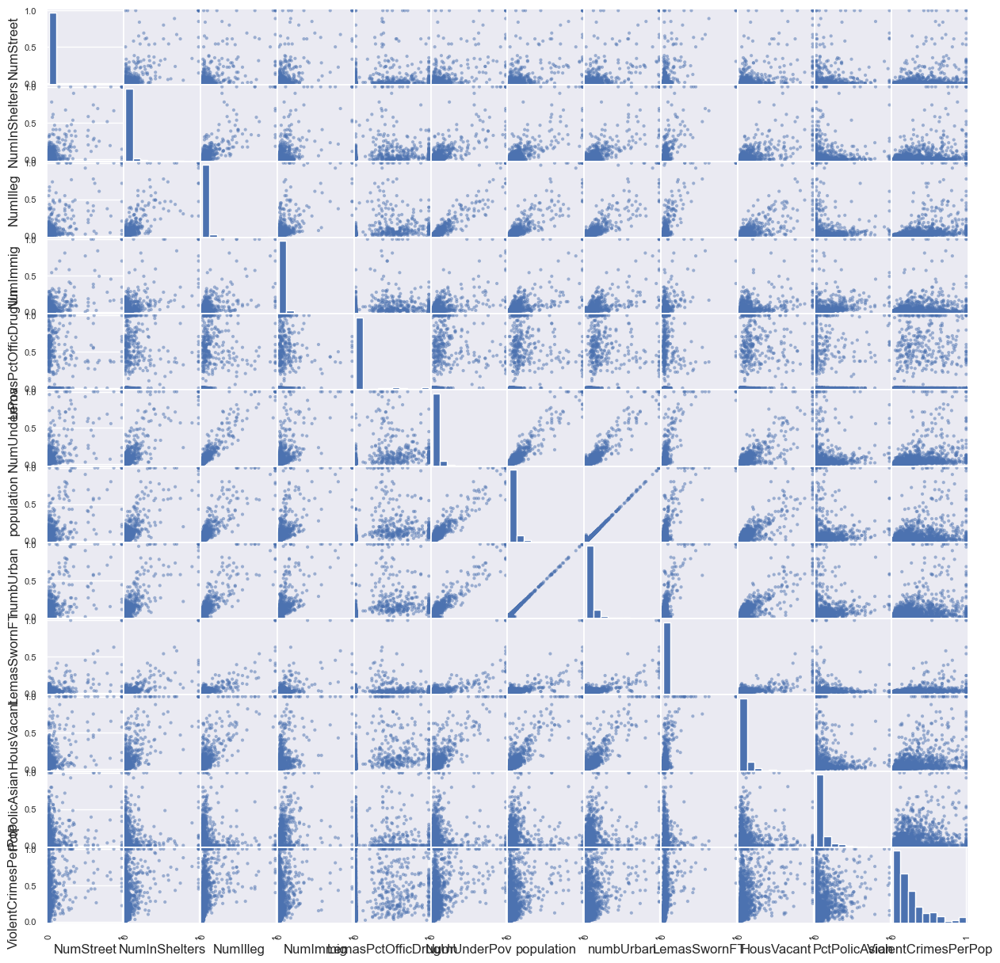

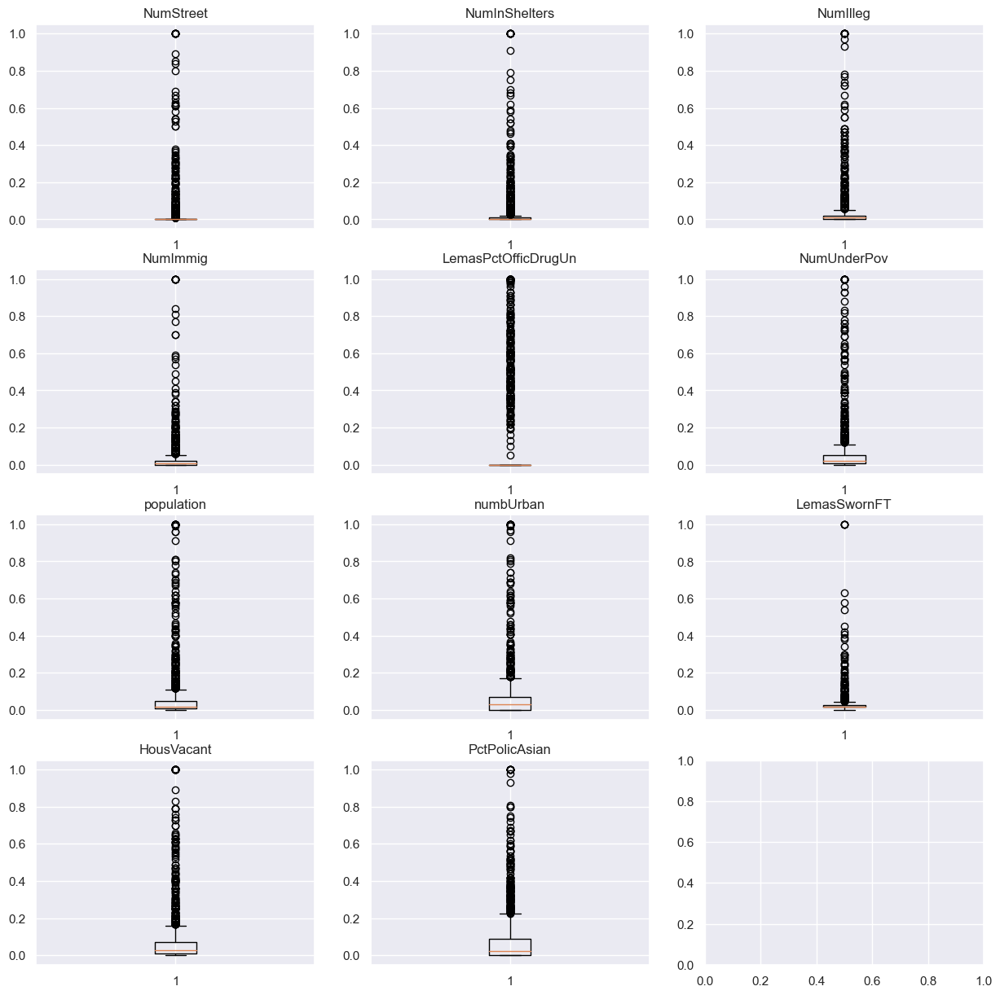

In [22]:
# Create scatter plot for the top 11 features

pd.plotting.scatter_matrix(top11_df, figsize=(15,15))
plt.show()

# Create boxplots for the top 11 features
fig, axs = plt.subplots(4, 3, figsize=(15,15))
axs = axs.flatten()
for i, feature in enumerate(top11_features):
    axs[i].boxplot(top11_df[feature])
    axs[i].set_title(feature)
plt.show()

### (f) Fit a linear model using least squares to the training set and report the test error.


In [47]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

# Load the dataset
data = crimedata_knn_filled

data_train = data[:1495]
data_test = data[1495:]

X_train = data_train.drop(['ViolentCrimesPerPop'],axis=1)
Y_train = data_train['ViolentCrimesPerPop']

X_test = data_test.drop(['ViolentCrimesPerPop'],axis=1)
Y_test = data_test['ViolentCrimesPerPop']

# Create a linear regression object
lm = LinearRegression()

# Fit the linear regression model to the training data
lm.fit(X_train, Y_train)

# Predict the response variable for the test set
y_pred = lm.predict(X_test)

# Calculate the test error (mean squared error)
test_error = mean_squared_error(Y_test, y_pred)

print("Test error: {:.2f}".format(test_error))


Test error: 0.02


### (g) Fit a ridge regression model on the training set, with 	$\lambda$  chosen by cross-validation. Report the test error obtained.

In [49]:
from sklearn.linear_model import RidgeCV

# Create a ridge regression object with cross-validation
alphas = [0.1, 1.0, 10.0, 100.0]  # Possible values of lambda
ridge = RidgeCV(alphas=alphas, cv=5)

# Fit the ridge regression model to the training data
ridge.fit(X_train, Y_train)

# Predict the response variable for the test set
y_ridge = ridge.predict(X_test)

# Calculate the test error (mean squared error)
test_error_ridge = mean_squared_error(Y_test, y_ridge)

print("Test error: {:.2f}".format(test_error_ridge))

Test error: 0.02


### (h) Fit a LASSO model on the training set, with $\lambda$   chosen by cross-validation. Report the test error obtained, along with a list of the variables selected by the model. Repeat with standardized [<sup>4</sup>](#fn4) features. Report the test error for both cases and compare them.

In [50]:
from sklearn.linear_model import LassoCV
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
import pandas as pd

# Load the dataset
data = crimedata_knn_filled

data_train = data[:1495]
data_test = data[1495:]

X_train = data_train.drop(['ViolentCrimesPerPop'],axis=1)
Y_train = data_train['ViolentCrimesPerPop']

X_test = data_test.drop(['ViolentCrimesPerPop'],axis=1)
Y_test = data_test['ViolentCrimesPerPop']

# Create a lasso regression object with cross-validation
alphas = [0.1, 1.0, 10.0, 100.0]  # Possible values of lambda
lasso = LassoCV(alphas=alphas, cv=5)

# Fit the lasso regression model to the training data
lasso.fit(X_train, Y_train)

# Predict the response variable for the test set
y_lasso = lasso.predict(X_test)

# Calculate the test error (mean squared error)
test_error_lasso = mean_squared_error(Y_test, y_lasso)

print("Test error: {:.2f}".format(test_error_lasso))


Test error: 0.05


In [58]:
# Standardize the features
from sklearn import preprocessing
X_train_norm = preprocessing.StandardScaler().fit(X_train).transform(X_train)
X_test_norm = preprocessing.StandardScaler().fit(X_test).transform(X_test)

# Create a lasso regression object with cross-validation
alphas = [0.1, 1.0, 10.0, 100.0]  # Possible values of lambda
lasso_norm = LassoCV(alphas=alphas, cv=5)

lasso_norm.fit(X_train_norm, Y_train)

# Predict the response variable for the test set
y_lasso_norm = lasso_norm.predict(X_test)

# Calculate the test error (mean squared error)
test_error_lasso_norm = mean_squared_error(Y_test, y_lasso_norm)

print("Test error: {:.2f}".format(test_error_lasso_norm))


Test error: 0.04


/Users/alberli/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LassoCV was fitted without feature names
  warnings.warn(


### (i) Fit a PCR model on the training set, with M (the number of principal components) chosen by cross-validation. Report the test error obtained.

In [61]:
from sklearn.decomposition import PCA

# Perform principal component analysis on the training data
pca = PCA()
X_train_pca = pca.fit_transform(X_train)

# Select the optimal number of principal components using cross-validation
ridgecv = RidgeCV(alphas=[0.1, 1.0, 10.0, 100.0], cv=5)
ridgecv.fit(X_train_pca, Y_train)

# Apply the same PCA transformation to the test data
X_test_pca = pca.transform(X_test)

# Predict the response variable for the test set
y_pred_pca = ridgecv.predict(X_test_pca)

# Calculate the test error (mean squared error)
test_error_pca = mean_squared_error(Y_test, y_pred_pca)

print("Test error: {:.2f}".format(test_error_pca))


Test error: 0.02


### (j) In this section, we would like to  fit a boosting tree to the data. As in classification trees, one can use any type of regression at each node to build a multivariate regression tree. Because the number of variables is large in this problem, one can use L1-penalized regression at each node. Such a tree is called L1 penalized gradient boosting tree. You can use XGBoost [<sup>5</sup>](#fn5) to  fit the model tree. Determine (the regularization term) using cross-validation.

In [63]:
#!pip install xgboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 19.3 MB/s eta 0:00:0000:0100:01


In [65]:
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
import pandas as pd


# Specify the parameter grid for cross-validation
param_grid = {'reg_alpha': [0, 0.001, 0.01, 0.1, 1, 10, 100]}

# Create an XGBoost regressor object
xg_reg = xgb.XGBRegressor(objective='reg:squarederror')

# Perform grid search cross-validation to find the optimal value of alpha
xg_reg_cv = GridSearchCV(xg_reg, param_grid, cv=5)
xg_reg_cv.fit(X_train, Y_train)

# Print the best value of alpha and corresponding mean test score
print("Best alpha value: {:.3f}".format(xg_reg_cv.best_params_['reg_alpha']))
print("Corresponding mean test score: {:.2f}".format(xg_reg_cv.best_score_))

# Fit an XGBoost model with the optimal alpha value and evaluate its performance on the test set
xg_reg_optimal = xgb.XGBRegressor(objective='reg:squarederror', reg_alpha=xg_reg_cv.best_params_['reg_alpha'])
xg_reg_optimal.fit(X_train, Y_train)
y_pred_xg = xg_reg_optimal.predict(X_test)
test_error_xg = mean_squared_error(Y_test, y_pred_xg)
print("Test error: {:.2f}".format(test_error_xg))


Best alpha value: 1.000
Corresponding mean test score: 0.64
Test error: 0.02


##### <span style='color:green '> Footnote section <span>
<span id="fn1"> 1. This data set is a multi-label data set. Sk-Learn seems to support building multi-label decision trees. Alternatively, you can use the label powerset method to convert it to a multiclass data set. Also, you can use the binary relevance method and build one decision tree for each label. It seems that the label powerset approach is more relevant here. Is that right?  </span>   
<span id="fn2">  2. You can use the code in
https://www.kdnuggets.com/2017/05/simplifying-decision-tree-interpretation-decision-rules-python.html. </span>   
<span id="fn3"> 3. Question you may encounter: I tried opening the dataset and download it but the  le is not readable.How to download the file? Just change .data to .csv. . </span>   
<span id="fn4"> 4. In this data set, features are already normalized.  </span>   
<span id="fn5"> 5. Some hints on installing XGBoost on Windows:http://www.picnet.com.au/blogs/guido/2016/09/22/xgboost-windows-x64-binaries-for-download/.</span>
